# A prediction of product sales of chain store Favorita in Ecuador.
**Задача проекта:** прогнозирование временного ряда продаж различных товаров, реализованных в магазинах Favorita.

Решение задачи будет включать несколько последовательных этапов:
1. Знакомство с данными.
2. Анализ характеристик временного ряда.
3. Построение baseline модели - MA. 
4. LinearRegression прогноз.
5. Построение модели ARIMA.
6. Прознозирование с помощью библиотеки Prophet.
7. Генерация признаков и прогноз с помощью классических алгоритмов ML -  градиентных бустингов XGBoost и Catboost.
8. Сравнительный анализ и выбор оптимального алгоритма.

[Ссылка NBVIEWER](https://nbviewer.org/github/YaroslavaVob/Time-Series_project/blob/d50119fd202b464ea4f9bf3a01570af34711e982/Sales%20time%20serie.ipynb)

И начинаем мы, по традиции, с импортирования необходимых пакетов.

In [87]:
import numpy as np
import pandas as pd
from tqdm import tqdm
import os

import matplotlib.pyplot as plt
import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode()

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller

from sklearn.model_selection import TimeSeriesSplit, cross_val_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.linear_model import LinearRegression

import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_predict

from prophet import Prophet

import xgboost as xgb
from xgboost import plot_importance, plot_tree
from catboost import CatBoostRegressor

import warnings
warnings.filterwarnings('ignore')

## 1. Знакомство с данными
Загрузим несколько строк и посмотрим на признаки в данных.

In [88]:
file_path = 'data/train.zip'  # путь к файлу
sample_data = pd.read_csv(file_path, nrows=100000) # загрузим небольшую выборку из данных
sample_data.head()

,id,date,store_nbr,item_nbr,unit_sales,onpromotion
0,0,2013-01-01,25,103665,7.0,NaN
1,1,2013-01-01,25,105574,1.0,NaN
2,2,2013-01-01,25,105575,2.0,NaN
3,3,2013-01-01,25,108079,1.0,NaN
4,4,2013-01-01,25,108701,1.0,NaN


In [89]:
# посмотрим, сколько различных магазинов в сети Favorita
sample_data['store_nbr'].unique()

array([25,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 23, 24, 26, 27, 28, 30, 31, 32, 33, 34, 35, 37, 38, 39,
       40, 41, 43, 44, 45, 46, 47, 48, 49, 50, 51, 54], dtype=int64)

Данные представлены в следующих признаках:
* date - дата реализации товара;
* store_nbr - идентификатор магазина (всего 54);
* item_nbr - идентификатор товара;
* unit_sales - количество проданного товара;
* onpromotion - участвовал ли этот item_nbr в продвижении на указанную дату.

Итак, целевая переменная - *unit_sales*, которую необходимо сгруппировать по датам для формирования временного ряда.

Наши данные очень объемные и мы используем для анализа характеристик временного ряда не все данные, а отберем продажи магазина store_nbr 25.

In [90]:
chunk_size = 100000  # размер чанка за раз
column_name = 'store_nbr'  # столбец, по которому будет фильтровать
id = [25]  # необходимый идентификатор магазина
filtered_data = []  # список для отфильтрованных наборов

# читаем файл частями и сразу фильтруем
for chunk in tqdm(pd.read_csv(file_path, compression='zip', chunksize=chunk_size)):
    chunk_filtered = chunk[chunk[column_name].isin(id)]  # фильруем по ID магазина
    filtered_data.append(chunk_filtered)                 # добавляем в список

# объединяем все отфильтрованные наборы в один DataFrame
store_25 = pd.concat(filtered_data, ignore_index=True)
store_25.head() 

1255it [01:33, 13.40it/s]


,id,date,store_nbr,item_nbr,unit_sales,onpromotion
0,0,2013-01-01,25,103665,7.0,NaN
1,1,2013-01-01,25,105574,1.0,NaN
2,2,2013-01-01,25,105575,2.0,NaN
3,3,2013-01-01,25,108079,1.0,NaN
4,4,2013-01-01,25,108701,1.0,NaN


Суммируем продажи по дате

In [91]:
store_25 = store_25.groupby("date")['unit_sales'].sum().reset_index()
store_25.tail()

,date,unit_sales
1613,2017-08-11,22800.841
1614,2017-08-12,15090.753
1615,2017-08-13,8570.598
1616,2017-08-14,8244.854
1617,2017-08-15,6522.788


Преобразуем даты в формат Datetime и формируем time serie.

In [92]:
store_25 = store_25.set_index(pd.DatetimeIndex(store_25['date']))
# удаляем дату как столбец
store_25.drop(['date'], axis = 1, inplace = True)
store_25.head() # смотрим на результат

,unit_sales
date,
2013-01-01,2511.619
2013-01-02,5316.224
2013-01-03,4442.913
2013-01-04,4844.354
2013-01-05,5817.526


Давайте идентичным образом сгруппируем продажи по всем магазинам.

In [93]:
chunk_size = 100000  # размер чанка
df_list = []  # для хранения преобразованных наборов

# читаем файл частями и сразу фильтруем
for chunk in tqdm(pd.read_csv(file_path, compression='zip', chunksize=chunk_size)):
    grouped_chunk = chunk.groupby('date')['unit_sales'].sum().reset_index()  # группируем по дате
    df_list.append(grouped_chunk)                                            # добавляем в список
# объединяем подготовленные чанки и группируем вновь, что избежать повторяющихся дат
sales = pd.concat(df_list, ignore_index=True).groupby('date')['unit_sales'].sum().reset_index() 
sales.head()

1255it [01:44, 12.02it/s]


,date,unit_sales
0,2013-01-01,2511.619
1,2013-01-02,496092.418
2,2013-01-03,361429.231
3,2013-01-04,354459.677
4,2013-01-05,477350.121


In [94]:
sales = sales.set_index(pd.DatetimeIndex(sales['date']))
# удаляем дату как столбец
sales.drop(['date'], axis = 1, inplace = True)
sales.head() # смотрим на результат

,unit_sales
date,
2013-01-01,2511.619
2013-01-02,496092.418
2013-01-03,361429.231
2013-01-04,354459.677
2013-01-05,477350.121


## 2. Анализ закономерностей и последовательностей временного ряда на примере продаж магазина №25.
### 2.1 Декомпозиция.
Начнем с декомпозиции ряда на тренд, сезонность и шум. Для этого используем функцию библиотеки statsmodels seasonal_decompose.

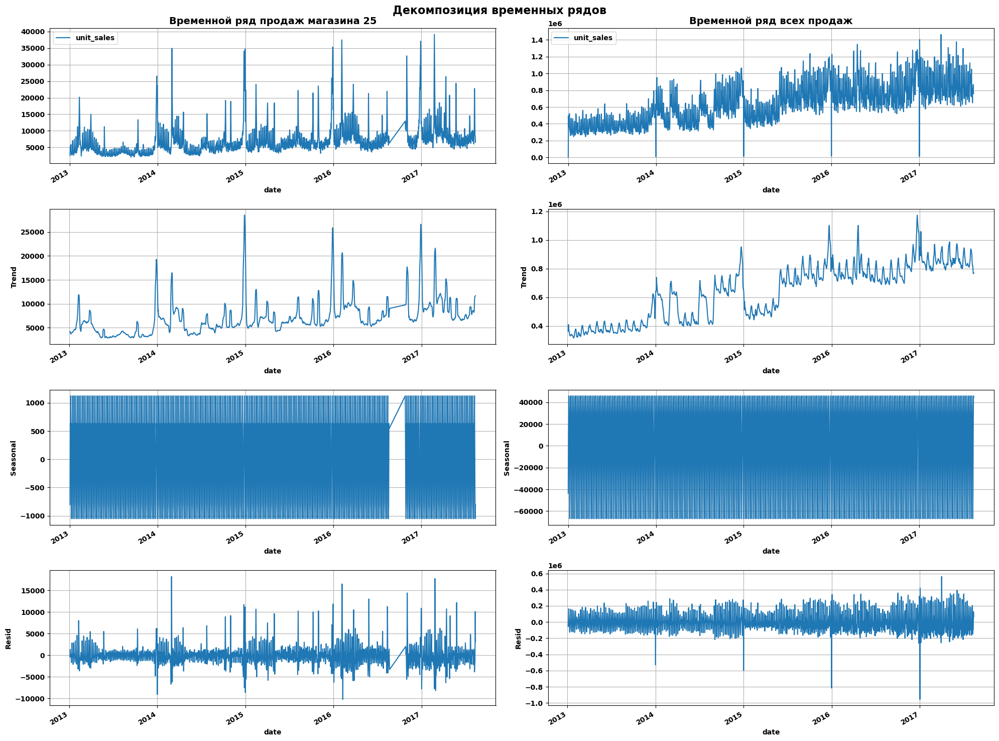

In [95]:
# декомпозируем временной ряд продаж магазина 25
serie_25 = seasonal_decompose(store_25, model='additive', period=7)
# декомпозируем временной ряд всех продаж
serie_full = seasonal_decompose(sales, model='additive', period=7)

# отобразим составляющие компоненты на графиках
fig, ax = plt.subplots(4, 2, figsize=(20, 15))
fig.suptitle('Декомпозиция временных рядов', fontsize=16)

# временной ряд продаж магазина 25
ax[0, 0].set_title('Временной ряд продаж магазина 25', fontsize=14)
store_25.plot(ax=ax[0, 0])
ax[0, 0].grid()
serie_25.trend.plot(ax=ax[1, 0], ylabel='Trend')
ax[1, 0].grid()
serie_25.seasonal.plot(ax=ax[2, 0], ylabel='Seasonal')
ax[2, 0].grid()
serie_25.resid.plot(ax=ax[3, 0], ylabel='Resid')
ax[3, 0].grid()

# временной ряд всех продаж
ax[0, 1].set_title('Временной ряд всех продаж', fontsize=14)
sales.plot(ax=ax[0, 1])
ax[0, 1].grid()
serie_full.trend.plot(ax=ax[1, 1], ylabel='Trend')
ax[1, 1].grid()
serie_full.seasonal.plot(ax=ax[2, 1], ylabel='Seasonal')
ax[2, 1].grid()
serie_full.resid.plot(ax=ax[3, 1], ylabel='Resid')
ax[3, 1].grid()

for i in range(4):
    ax[i, 1].tick_params(axis='x', rotation=30)

plt.tight_layout()
plt.show()

**Вывод**:\
Мы наблюдаем восходящий тренд в общих продажах, есть признаки цикличности, например, такой как резкий скачок вверх и падение в конце года.

### 2.2 Проверка на стационарность
Из той же библиотеки statsmodels используем тест Дики-Фуллера adfuller().\
Стационарность временного ряда означает, что математическое ожидание, дисперсия и совместное распределение вероятности значений ряда не меняются при сдвиге во времени в отличие от изменения значений со временем.\
Стационарный процесс предсказуем. У стационарного ряда отсутствует тренд и сезонность.

* Нулевая гипотеза $H_0$: временной ряд нестационарен, т.е. имеет некоторый тренд и сезонную компоненту. Значение статистики $p > \alpha$ - уровня значимости.
* Альтернатиная гипотеза $H_1$: временной ряд стационарен, не имеет тренда и сезонной компоненты, данные скорее случайны. Значение статистики $p < \alpha$ - уровня значимости.

Если тест подтвердит нестационарность, то применим дифференцирование ряда - разность между двумя соседними наблюдениями. Дифференцирование мы будем повторять до тех пор пока ряд не приобретет стационарность. Весь этот процесс обернем в функцию.

In [96]:
# функция тестирования временного ряда на стационарность и дифференцирования его в случае нестационарности
def get_stationary(Series):
    data = Series.copy()
    test = adfuller(data)                    # функция тестирования
    print('adf: ', test[0])                  # значение критерия теста
    print('p-value: ', test[1])              # значение p-value
    print('Critical values: ', test[4])      # пороговые значения доверительного интервала (0.01, 0.05, 0.1)
    count = 0                                # переменная для подсчета порядка дифференцирования
    while test[0] > test[4]['5%']:
        print('Ряд не стационарен')
        data = data.diff().dropna()          # дифференцируем с помощью функции diff() 
        test = adfuller(data)                # вновь тестируем
        count += 1
    else:
        print('Ряд стационарен')
        print('-----------------------')
    return count, data

In [97]:
all_sales = sales.copy() # сохраним временной ряд общих продаж для дальнейшего использования в моделировании
i_25, store_25 = get_stationary(store_25)
i_all, sales = get_stationary(sales)
print('Порядок интегрирования временного ряда магазина 25: ', i_25)
print('Порядок интегрирования временного ряда общих продаж: ', i_all)

adf:  -4.858992665318181
p-value:  4.1883941929077723e-05
Critical values:  {'1%': -3.4344642432857992, '5%': -2.8633571955690647, '10%': -2.5677374399794197}
Ряд стационарен
-----------------------
adf:  -2.616584209682394
p-value:  0.08961786174889536
Critical values:  {'1%': -3.4342930672797065, '5%': -2.8632816397229064, '10%': -2.567697207194407}
Ряд не стационарен
Ряд стационарен
-----------------------
Порядок интегрирования временного ряда магазина 25:  0
Порядок интегрирования временного ряда общих продаж:  1


### 2.3 Автокорреляция и частичная автокорреляция.
1) Автокорреляция - это корряция временного ряда с самим с собой: насколько значение во временном ряду похоже на предыдущее. Она помогает выявлять тенденции и оценивать влиянее ранее наблюдаемых значений (лагов) на текущее наблюдение. Значения на коррелограмме будут близки к нулю, если данные ряда не зависят от себя в прошлом. Если максимальное значение на коррелограмме находится в лаге 1, то ряд содержит только тренд. Если максимальное значение выражено лагом, например, 5, то временной ряд содержит циклическую компоненту с периодом 5. 
2) Частичная автокорреляция описывает только прямую связь между текущим наблюдением и наблюдениями на предыдущем отрезке времени с удалением взаимосвязей между промежуточными наблюдениями. Частичная автокорреляция даёт более «чистую» картину периодических зависимостей, так как исключается влияние автокорреляций с меньшими лагами.

Для построения графиков мы воспользуемся функциями *plot_acf* и *plot_pacf* библиотеки statsmodels.

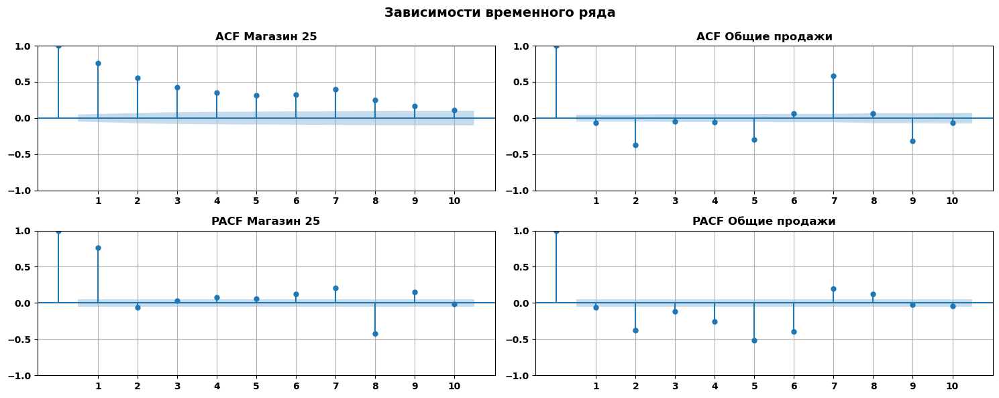

In [98]:
fig, ax = plt.subplots(2, 2, figsize=(15, 6)) 
fig.suptitle('Зависимости временного ряда', fontsize=14)
# автокорреляция магазина 25
sm.graphics.tsa.plot_acf(store_25, lags=10, ax=ax[0, 0])
ax[0, 0].set_title('ACF Магазин 25')
ax[0, 0].set_xticks(np.arange(1, 11))
ax[0, 0].grid()
# частичная автокорреляция магазина 25
sm.graphics.tsa.plot_pacf(store_25, lags=10, ax=ax[1, 0])
ax[1, 0].set_title('PACF Магазин 25')
ax[1, 0].set_xticks(np.arange(1, 11))
ax[1, 0].grid()

# автокорреляция всех продаж
sm.graphics.tsa.plot_acf(sales, lags=10, ax=ax[0, 1])
ax[0, 1].set_title('ACF Общие продажи')
ax[0, 1].set_xticks(np.arange(1, 11))
ax[0, 1].grid()
# частичная автокорреляция всех продаж
sm.graphics.tsa.plot_pacf(sales, lags=10, ax=ax[1, 1])
ax[1, 1].set_title('PACF Общие продажи')
ax[1, 1].set_xticks(np.arange(1, 11))
ax[1, 1].grid()

plt.tight_layout()  
plt.show()

**Выводы**:\
Магазин 25: порядок авторегрессии ($p$) определяется по графику частичной автокорреляции - максимальный лаг здесь однозначно 8, можно еще рассмотреть 7.\
Определение окна скользящего среднего ($q$) по графику автокорреляции - можно попробовать пару вариантов: лаг 2 и лаг 7.\

Общие продажи: порядок AR $p$ = 2, 5 или 6 оптимальные значения.\
Размер скользящего среднего $q$ = 7.

### 2.4 Построение графиков скользящего среднего и экспоненциального скользящего для временного ряда продаж магазина 25.
Построим функцию скользящего среднего (moving average) с помощью метода rolling().\
Принимает в качестве параметра размер окна (сумма нескольких последовательных наблюдений временного ряда), значение которого усредняется или агрегируется любым другим способом.\
Также добавим экспоненциальное сглаживание, для этого предусмотрена функция ewm() в pandas.

In [99]:
# зададим размер окна по умолчанию - 7 для простого скользящего и экспоненциального
def mean_rolling(df, column_name='unit_sales', window=7, period=7):
    data = df.copy()
    data['mean_sales'] = data[column_name].rolling(window=window).mean()
    data['std_sales'] = data[column_name].rolling(window=window).std()
    data['ema'] = data[column_name].ewm(min_periods=period, span=period).mean()  # экспоненциальная скользящая средняя
    return data

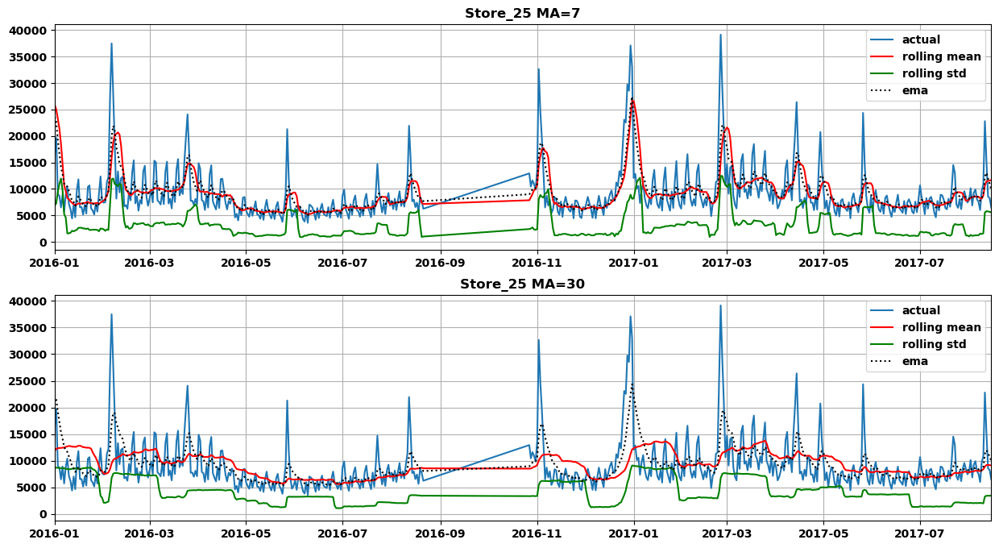

In [100]:
# применим функцию
store_25_ma = mean_rolling(store_25)
# увеличим размер окна скользящего до месяца и сравним на графике
store_25_ma_ = mean_rolling(store_25, window=30, period=10)

# визуализируем
fig, ax = plt.subplots(2, 1, figsize=(15, 8))
ax[0].set_title('Store_25 MA=7')
ax[0].plot(store_25_ma.index, store_25_ma.unit_sales)                          # исходные данные
ax[0].plot(store_25_ma.index, store_25_ma.mean_sales, c='r', linewidth=1.5)    # оконное среднее
ax[0].plot(store_25_ma.index, store_25_ma.std_sales,  c='g')                   # оконное стандартное отклонение
ax[0].plot(store_25_ma.index, store_25_ma.ema,  c='black', linestyle='dotted') # экспоненциальная скользящая
ax[0].legend(['actual', 'rolling mean', 'rolling std', 'ema'])
ax[0].set_xlim(pd.to_datetime('2016-01-01'), pd.to_datetime('2017-08-15'))
ax[0].grid()
ax[1].set_title('Store_25 MA=30')
ax[1].plot(store_25_ma_.index, store_25_ma_.unit_sales)                        # исходные данные
ax[1].plot(store_25_ma_.index, store_25_ma_.mean_sales, c='r', linewidth=1.5)  # оконное среднее
ax[1].plot(store_25_ma_.index, store_25_ma_.std_sales,  c='g')                 # оконное стандартное отклонение
ax[1].plot(store_25_ma_.index, store_25_ma_.ema,  c='black', linestyle='dotted')  # экспоненциальная скользящая
ax[1].legend(['actual', 'rolling mean', 'rolling std', 'ema'])
ax[1].set_xlim(pd.to_datetime('2016-01-01'), pd.to_datetime('2017-08-15'))
ax[1].grid()
plt.show()

Мы видим, что MA с окном 30 неплохо сглаживает временной ряд, а стандартное отклонение отражает резкие скачки.

Построим линии Боллинджера с окном в 30: прибавим к скользящему среднему скользящее стандартное отклонение, умноженное на три — верхняя линия Боллинджера; отнимем от скользящего среднего скользящее стандартное отклонение, умноженное на три — нижняя линия Боллинджера.

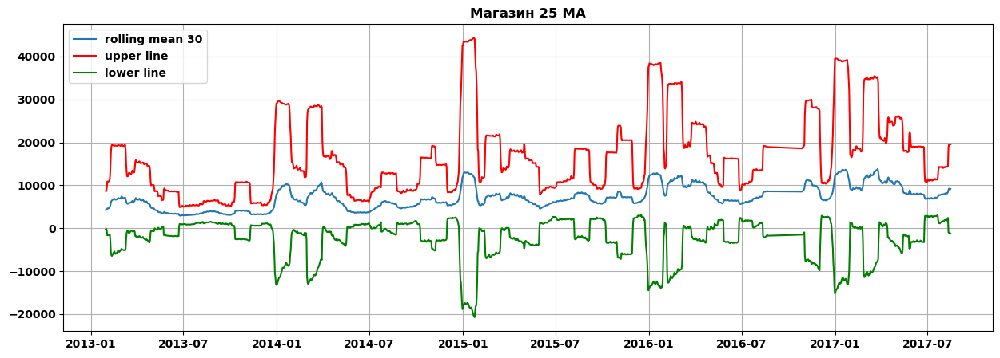

In [101]:
store_25_ma = mean_rolling(store_25, window=30)
upper_25 = store_25_ma['mean_sales'] + 3 * store_25_ma['std_sales']
lower_25 = store_25_ma['mean_sales'] - 3 * store_25_ma['std_sales']

# визуализируем
fig, ax = plt.subplots(1, 1, figsize=(15, 5))
ax.set_title('Магазин 25 MA')
ax.plot(store_25_ma.index, store_25_ma['mean_sales'])  # скользящее среднее с окном 30
ax.plot(store_25_ma.index, upper_25, c='r')            # верхняя линия
ax.plot(store_25_ma.index, lower_25,  c='g')           # нижняя линия
ax.legend(['rolling mean 30', 'upper line', 'lower line'])
ax.grid()
plt.show()

In [102]:
'''
Cкользящая функция, которая является средним арифметическим между максимальным и минимальным значением unit_sales, с окном 10.
'''
# def rolling_mean(df, column_name, n=10):
#     df['rolling_mean'] = np.mean(df[column_name].rolling(window=n).max()-df[column_name].rolling(window=n).min())
#     return df

'\nCкользящая функция, которая является средним арифметическим между максимальным и минимальным значением unit_sales, с окном 10.\n'

Построим скользящее среднее с окном 50 и экспоненциальное скользящее среднее с окном 10 (span=10).\
Посмотрим индексы ряда, на которых одно скользящее пересекается с другим:\
для этого вычитаем из одного скользящего среднего другое, взяв знак этой разности (np.sign), дифференциируем его (diff()) и оставляем только те точки, где результат дифференциирования не равен нулю.

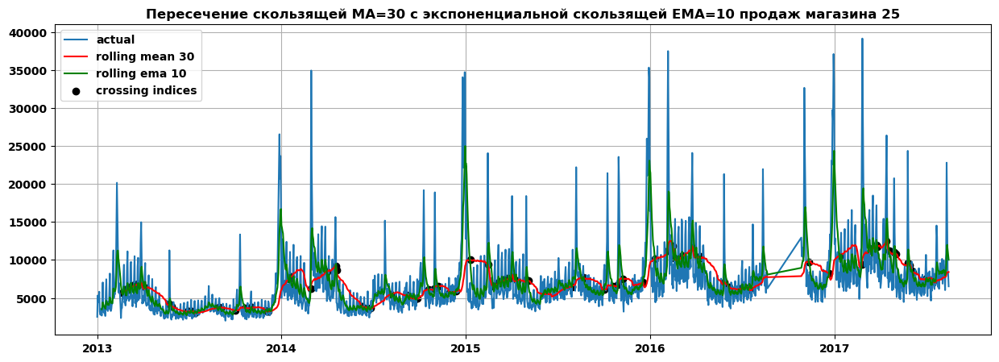

In [103]:
store_25_ma = mean_rolling(store_25, 'unit_sales', window=50, period=10)
crossing_indices_25 = np.sign(store_25_ma['mean_sales'] - store_25_ma['ema']).diff().dropna()
crossing_indices_25 = crossing_indices_25[crossing_indices_25 != 0].index  # оставляем только пересечения, отличные от нуля  

# визуализируем
fig, ax = plt.subplots(1, 1, figsize=(15, 5))
ax.plot(store_25_ma.index, store_25_ma.unit_sales)             # исходные данные
ax.plot(store_25_ma.index, store_25_ma['mean_sales'], c='r')   # скользящее среднее с окном 30
ax.plot(store_25_ma.index, store_25_ma['ema'],  c='g')         # экспоненциальное скользящее среднее 10
ax.scatter(crossing_indices_25, store_25_ma['mean_sales'].loc[crossing_indices_25], color='black', marker='o', label="Crossing Indices")
ax.legend(['actual', 'rolling mean 30', 'rolling ema 10', 'crossing indices'])
ax.set_title('Пересечение скользящей MA=30 с экспоненциальной скользящей EMA=10 продаж магазина 25')
ax.grid()
fig.show()

### 2.5 Изучение лаговых факторов временного ряда продаж магазина 25.
Мы возьмем с 6 по 10 лаг включительно и отображим на графикам, чтобы сравнить значимость.

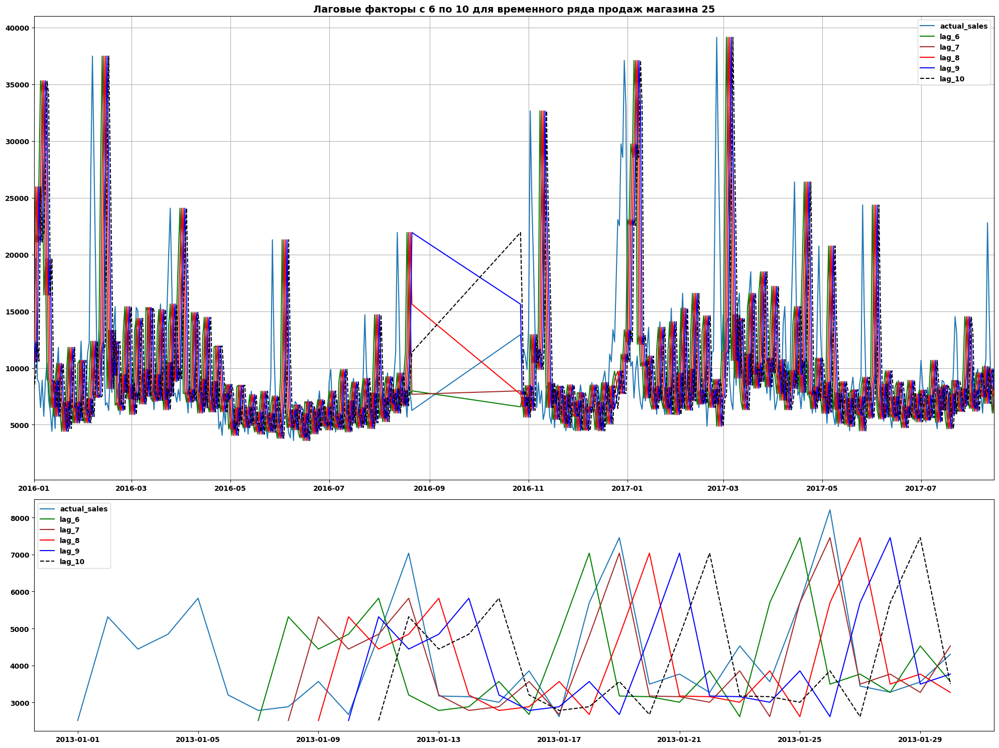

In [104]:
store_25_lags = store_25.copy()
for i in range(6,11):
    store_25_lags['lag_{}'.format(i)] = store_25_lags.unit_sales.shift(i)

# визуализируем
fig, ax = plt.subplots(2, 1, figsize=(20, 15), gridspec_kw={'height_ratios': [2, 1]})
ax[0].set_title('Лаговые факторы с 6 по 10 для временного ряда продаж магазина 25', fontsize=14)
ax[0].plot(store_25_lags.index, store_25_lags.unit_sales)                  # исходные данные
ax[0].plot(store_25_lags.index, store_25_lags['lag_' + str(6)],  c='g') 
ax[0].plot(store_25_lags.index, store_25_lags['lag_' + str(7)],  c='brown') 
ax[0].plot(store_25_lags.index, store_25_lags['lag_' + str(8)],  c='r') 
ax[0].plot(store_25_lags.index, store_25_lags['lag_' + str(9)],  c='b') 
ax[0].plot(store_25_lags.index, store_25_lags['lag_' + str(10)],  c='black', linestyle='dashed') 
ax[0].legend(['actual_sales', 'lag_6', 'lag_7', 'lag_8', 'lag_9', 'lag_10'])
ax[0].set_xlim(pd.to_datetime('2016-01-01'), pd.to_datetime('2017-08-15'))
ax[0].grid()
# для детального изучения возьмем ограниченное количество значений ряда
ax[1].plot(store_25_lags.index[:30], store_25_lags.unit_sales[:30])        # исходные данные
ax[1].plot(store_25_lags.index[:30], store_25_lags['lag_' + str(6)][:30],  c='g') 
ax[1].plot(store_25_lags.index[:30], store_25_lags['lag_' + str(7)][:30],  c='brown') 
ax[1].plot(store_25_lags.index[:30], store_25_lags['lag_' + str(8)][:30],  c='r') 
ax[1].plot(store_25_lags.index[:30], store_25_lags['lag_' + str(9)][:30],  c='b') 
ax[1].plot(store_25_lags.index[:30], store_25_lags['lag_' + str(10)][:30],  c='black', linestyle='dashed') 
ax[1].legend(['actual_sales', 'lag_6', 'lag_7', 'lag_8', 'lag_9', 'lag_10'])
plt.tight_layout()
plt.show()

**Вывод:**\
По нижнему графику мы видим, что наибольшее совпадение имеет лаг 7, то есть на прогноз для любой даты наибольшее влияние оказывает значение недельной давности.

## 3. Построение модели скользящего среднего.
Модели MA подходят лишь для краткосрочных прогнозов, поэтому мы будем ассматривать предсказания не более, чем на 7 дней.

(7,) (7,)
MSE 38569511.44
MAE 4810.47
MAPE 40.05


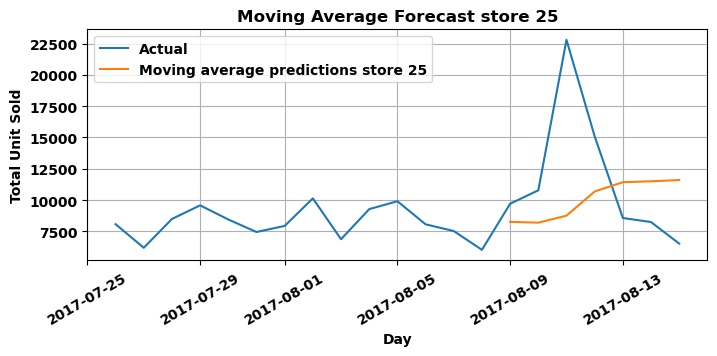

In [105]:
store_MA = store_25.squeeze() # преобразование в 1D-массив
# функция прогнозирования методом MA
def moving_average_forecast(series, window_size):
    forecast = []
    for time in range(len(series) - window_size):
        forecast.append(series[time:time + window_size].mean())
    return np.array(forecast)

moving_average_days = 7  # задаем размер окна - неделя
shown_train_size = moving_average_days * 3
# применяем функцию
moving_avg = moving_average_forecast(store_MA, moving_average_days)
moving_avg = pd.Series(moving_avg, index = store_MA[moving_average_days:].index)

print(moving_avg[-moving_average_days:].shape, store_MA[-moving_average_days:].shape)
# рассчитываем метрики качества
print("MSE", np.round(mean_squared_error(store_MA.values[-moving_average_days:], moving_avg[-moving_average_days:]),2))
print("MAE", np.round(mean_absolute_error(store_MA.values[-moving_average_days:], moving_avg[-moving_average_days:]),2))
print("MAPE", np.round(mean_absolute_percentage_error(store_MA.values[-moving_average_days:], moving_avg[-moving_average_days:])*100,2))

# отражаем прогноз на графике
plt.figure(figsize=(8,3))
plt.plot(store_MA[-shown_train_size:], label="Actual")
plt.plot(moving_avg[-moving_average_days:], label="Moving average predictions store 25")
plt.ylabel("Total Unit Sold")
plt.xlabel("Day")
plt.xticks(rotation=30)
plt.title("Moving Average Forecast store 25")
plt.legend(loc="upper left")
plt.grid()
plt.show()

Краткосрочный прогноз с помощью модели MA объема продаж по всей сети магазинов.

(7,) (7,)
MSE 7884830902.4
MAE 60549.99
MAPE 8.43


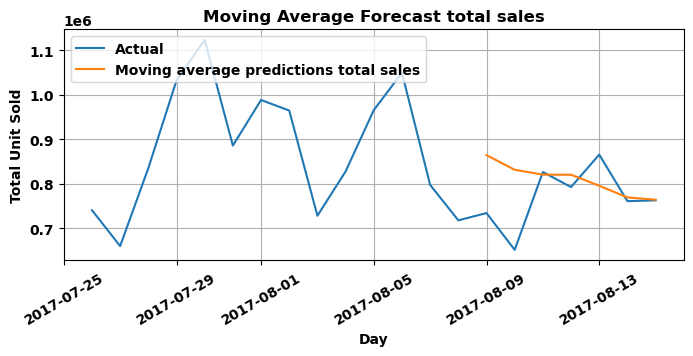

In [106]:
sales_MA = all_sales.squeeze() # преобразование в 1D- массив

moving_average_days = 7 # размер окна MA
shown_train_size = moving_average_days * 3

moving_avg = moving_average_forecast(sales_MA, moving_average_days)
moving_avg = pd.Series(moving_avg, index = sales_MA[moving_average_days:].index)

print(moving_avg[-moving_average_days:].shape,sales_MA[-moving_average_days:].shape)

print("MSE", np.round(mean_squared_error(sales_MA.values[-moving_average_days:], moving_avg[-moving_average_days:]),2))
print("MAE", np.round(mean_absolute_error(sales_MA.values[-moving_average_days:], moving_avg[-moving_average_days:]),2))
print("MAPE", np.round(mean_absolute_percentage_error(sales_MA.values[-moving_average_days:], moving_avg[-moving_average_days:])*100,2))

plt.figure(figsize=(8,3))

plt.plot(sales_MA[- shown_train_size:], label="Actual")
plt.plot(moving_avg[-moving_average_days:], label="Moving average predictions total sales")
plt.ylabel("Total Unit Sold")
plt.xlabel("Day")
plt.xticks(rotation=30)
plt.title("Moving Average Forecast total sales")
plt.legend(loc="upper left")
plt.grid()
plt.show()

**Вывод**:\
Прогноз с помощью простой модели скользящего среднего для магазина 25 очень неудачен, практически равен случайному угадыванию.\
А вот с задачай прогноза на краткий период для всего объема продаж лучше справляется, но видно по графику, что в обеих случаях MA не уловила колебаний исходного ряда значений. И это большой минус для построения любых кратких или долгих прогнозов.

Давайте не будем сразу исключать данную модель как неэффективную и попробуем с помощью нее предсказать временной ряд продаж одного товара. Выберем продукт с номером 103501 (item_nbr).

Загружаем данные по продукту 103501 и группируем по дате с агрегацией .sum().

In [107]:
column_name = 'item_nbr'  # название столбца, по которому фильтруем
id = 103501               # идентификатор товара
filtered_data = []        # список для хранения наборов

# читаем файл частями и фильтруем
for chunk in tqdm(pd.read_csv(file_path, compression='zip', chunksize=chunk_size)):
    chunk_filtered = chunk[chunk[column_name]==id]  # фильтруем
    filtered_data.append(chunk_filtered)            # добавляем в список

# объединяем все отфильтрованные чанки в один DataFrame
item_sales = pd.concat(filtered_data, ignore_index=True).reset_index()
item_sales.head()  # Выводим результат

1255it [01:28, 14.24it/s]


,index,id,date,store_nbr,item_nbr,unit_sales,onpromotion
0,0,9389,2013-01-02,9,103501,19.0,NaN
1,1,10410,2013-01-02,10,103501,8.0,NaN
2,2,11087,2013-01-02,11,103501,13.0,NaN
3,3,12049,2013-01-02,12,103501,7.0,NaN
4,4,12764,2013-01-02,13,103501,13.0,NaN


In [108]:
item_sales['date'] = pd.to_datetime(item_sales['date'])                   # преобразуем дату в нужный формат
unit_sales = item_sales.groupby('date')['unit_sales'].sum().reset_index() # группируем
unit_sales.set_index('date', inplace=True)                                # преобразуем в time serie
unit_sales.head()

,unit_sales
date,
2013-01-02,185.0
2013-01-03,153.0
2013-01-04,155.0
2013-01-05,160.0
2013-01-06,173.0


Проверяем на стационарность

In [109]:
# применим функцию преобразования ряда к стационарному
i_unit, unit_sales = get_stationary(unit_sales)
# выведем порядок дифференцирования
print('Порядок интегрированного ряда: ', i_unit)

adf:  -4.15440305801462
p-value:  0.0007863083913836295
Critical values:  {'1%': -3.4344462031760283, '5%': -2.8633492329988335, '10%': -2.5677331999518147}
Ряд стационарен
-----------------------
Порядок интегрированного ряда:  0


Ряд - стационарный. Таким образом, для прогноза с помощью модели ARIMA параметр $d$=0.

Для начала мы делаем прогноз методом скользящего среднего, используя тот же алгоритм как для временного ряда магазина 25.

(6,) (6,)
MSE 287.09
MAE 13.42
MAPE 17.21


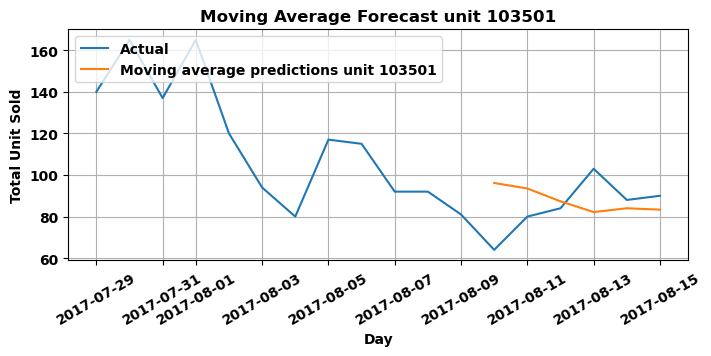

In [110]:
unit_MA = unit_sales.squeeze() # преобразование в 1D- массив

moving_average_days = 6 # размер окна MA
shown_train_size = moving_average_days * 3

moving_avg = moving_average_forecast(unit_MA, moving_average_days)
moving_avg = pd.Series(moving_avg, index = unit_MA[moving_average_days:].index)

print(moving_avg[-moving_average_days:].shape,unit_MA[-moving_average_days:].shape)

print("MSE", np.round(mean_squared_error(unit_MA.values[-moving_average_days:], moving_avg[-moving_average_days:]),2))
print("MAE", np.round(mean_absolute_error(unit_MA.values[-moving_average_days:], moving_avg[-moving_average_days:]),2))
print("MAPE", np.round(mean_absolute_percentage_error(unit_MA.values[-moving_average_days:], moving_avg[-moving_average_days:])*100,2))

plt.figure(figsize=(8,3))

plt.plot(unit_MA[- shown_train_size:], label="Actual")
plt.plot(moving_avg[-moving_average_days:], label="Moving average predictions unit 103501")
plt.ylabel("Total Unit Sold")
plt.xlabel("Day")
plt.xticks(rotation=30)
plt.title("Moving Average Forecast unit 103501")
plt.legend(loc="upper left")
plt.grid()
plt.show()

**Вывод**:\
Прогноз на короткий период, при этом ошибка, по-прежнему, довольно большая и для этого ряда продаж отдельной позиции, но это точно лучше случайного угадвания, как в предыдущем случае.\
Теперь нам предстоит улучшить качество прогнозирования с помощью других подходов. 

На всякий случай уделим пару строк классике - линейной регрессии, чтобы посмотреть ее эффективность на нашем ряду.\
Создадим признаки-лаги с 1 по 7 включительно для предсказания целевой переменной - объемов продажи продукта 103501.
### Модель LinearRegression

Среднее MSE на кросс-валидации: 452.57
[ 5.61214402e-01 -7.46956754e-02 -5.26600315e-03  1.25653111e-04
 -4.76365645e-02  1.45345088e-01  2.65353982e-01]
15.667714485672363
MSE: 144.09
MAE: 9.58
MAPE: 12.34


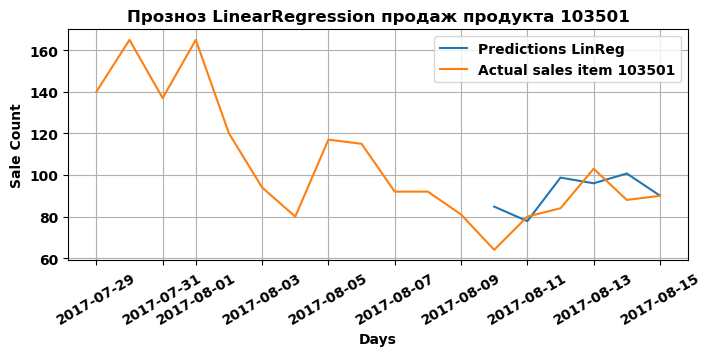

In [111]:
predict_size_unit = 6
shown_train_size_unit = predict_size_unit * 3
unit_lr = pd.DataFrame()
unit_lr["Original Values"] = unit_sales
for lag in range(1, 8):
    unit_lr[f"lag_{lag}"] = unit_lr["Original Values"].shift(lag)

unit_lr.dropna(inplace=True)

# разделение данных на признаки и целевую переменную
X = unit_lr.drop(columns=["Original Values"])
y = unit_lr["Original Values"]

# инициализация TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=3, test_size=7)

# инициализируем алгоритм линейной регрессии
reg = LinearRegression()
# кросс-валидация (метрика - MSE)
cv_scores = -cross_val_score(reg, X, y, cv=tscv, scoring="neg_mean_squared_error")
print("Среднее MSE на кросс-валидации:", np.round(cv_scores.mean(), 2))

# обучаем модель на всем тренировочном наборе данных
reg.fit(X[:-predict_size_unit], y[:-predict_size_unit])
print(reg.coef_)      # выведем веса признаков-лагов для определения значимости в предсказании
print(reg.intercept_)
# предсказываем
ar_predictions_unit = pd.Series(reg.predict(X[-predict_size_unit:]), index=X[-predict_size_unit:].index)
# выводим метрики
print("MSE:", np.round(mean_squared_error(y[-predict_size_unit:], ar_predictions_unit), 2))
print("MAE:", np.round(mean_absolute_error(y[-predict_size_unit:], ar_predictions_unit), 2))
print("MAPE:", np.round(mean_absolute_percentage_error(y[-predict_size_unit:], ar_predictions_unit) * 100, 2))

plt.figure(figsize=(8,3))
plt.title('Прозноз LinearRegression продаж продукта 103501')
plt.plot(ar_predictions_unit, label = "Predictions LinReg")
plt.plot(y[-shown_train_size_unit:], label = "Actual sales item 103501")
plt.xlabel("Days")
plt.xticks(rotation=30)
plt.ylabel("Sale Count")
plt.legend(loc="upper right")
plt.grid()
plt.show()

Мы прилично сократили ошибку: с 17.21 (MAPE) до 12.34. Линейная регрессия неплохо справилась на краткосрочном прогнозировании.\
Также мы видим лаг_1 (значение вчера) в лидерах значимости для прогноза, сильное влияние оказывают лаг 7 и чуть меньше лаг 6. 

Давайте посмотрим эффективность использования классической линейной регрессии для ряда всех продаж в краткосрочном прогнозе.

Среднее MSE на кросс-валидации: 5948273014.81
[ 0.46329054 -0.06141149  0.13165635  0.01968473  0.00249841  0.10502934
  0.29495004 -0.12622742 -0.12259536 -0.04137985 -0.00358098 -0.08718524
  0.10142943  0.29631351]
19248.70749641338
MSE: 6575065815.64
MAE: 56687.93
MAPE: 7.09


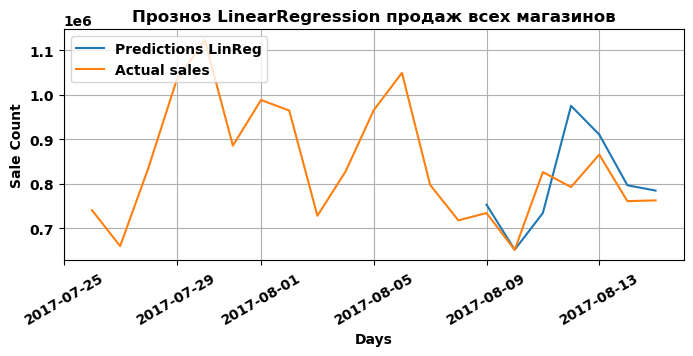

In [112]:
predict_size_all = 7 # период прогноза
shown_train_size_all = predict_size_all * 3
sales_lr = pd.DataFrame()
sales_lr["Original Values"] = all_sales

for lag in range(1, 15):
    sales_lr[f"lag_{lag}"] = sales_lr["Original Values"].shift(lag)

# sales_lr["dayofyear"] = sales_lr.index.dayofyear
# sales_lr["rolling_mean_7"] = sales_lr["Original Values"].rolling(window=7).mean()  # скользящая средняя
# sales_lr["ema_7"] = sales_lr["Original Values"].ewm(span=7, adjust=False).mean()  # экспоненциальное сглаживание
sales_lr.dropna(inplace=True)

# разделение данных на признаки и целевую переменную
X = sales_lr.drop(columns=["Original Values"])
y = sales_lr["Original Values"]

# инициализация TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=5, test_size=14)

# инициализируем алгоритм линейной регрессии
reg = LinearRegression()
# кросс-валидация (метрика - MSE)
cv_scores = -cross_val_score(reg, X, y, cv=tscv, scoring="neg_mean_squared_error")
print("Среднее MSE на кросс-валидации:", np.round(cv_scores.mean(), 2))

# обучаем модель на всем тренировочном наборе данных
reg.fit(X[:-predict_size_all], y[:-predict_size_all])
print(reg.coef_)      # выведем веса признаков-лагов для определения значимости в предсказании
print(reg.intercept_)
# предсказываем
ar_predictions_all = pd.Series(reg.predict(X[-predict_size_all:]), index=X[-predict_size_all:].index)
# выводим метрики
print("MSE:", np.round(mean_squared_error(y[-predict_size_all:], ar_predictions_all), 2))
print("MAE:", np.round(mean_absolute_error(y[-predict_size_all:], ar_predictions_all), 2))
print("MAPE:", np.round(mean_absolute_percentage_error(y[-predict_size_all:], ar_predictions_all) * 100, 2))

plt.figure(figsize=(8,3))
plt.title('Прозноз LinearRegression продаж всех магазинов')
plt.plot(ar_predictions_all, label = "Predictions LinReg")
plt.plot(y[-shown_train_size_all:], label = "Actual sales" )
plt.xlabel("Days")
plt.xticks(rotation=30)
plt.ylabel("Sale Count")
plt.legend(loc="upper left")
plt.grid()
plt.show()

In [113]:
predict_size = 90 # прогноз на 3 месяца
x_train_all_, y_train_all_ = sales_lr[:-predict_size].drop(["Original Values"], axis=1), sales_lr[:-predict_size]["Original Values"]
x_test_all_, y_test_all_ = sales_lr[-predict_size:].drop(["Original Values"], axis =1), sales_lr[-predict_size:]["Original Values"]

reg = LinearRegression().fit(x_train_all_, y_train_all_)
ar_predictions = pd.Series(reg.predict(x_test_all_), index=x_test_all_.index)
print("MSE LR прогноза на 3 месяца", np.round(mean_squared_error(y_test_all_, ar_predictions), 2))
print("MAE LR прогноза на 3 месяца", np.round(mean_absolute_error(y_test_all_, ar_predictions), 2))
print("MAPE LR прогноза на 3 месяца", np.round(mean_absolute_percentage_error(y_test_all_, ar_predictions)*100, 2))

MSE LR прогноза на 3 месяца 7706831715.2
MAE LR прогноза на 3 месяца 62569.61
MAPE LR прогноза на 3 месяца 7.0


**Вывод:**\
Итак, мы подтвердили, что лаги 1, 7, меньше 6 значимы для прогноза.\
Прогноз LinearRegression для краткосрочного периода довольно эффективен в нашем случае.

## 4. Модель ARIMA для прогнозирования продукта 103501.
ARIMA применяется, когда ряд не стационарен, имеется тренд и задается параметр d, отвечающий за порядок интегрированного (дифференцированного) ряда.

Итак, чтобы построить ARIMA модель нам необходимо определить 3 параметра:
* p — порядок компоненты AR
* d — порядок интегрированного ряда
* q — порядок компонетны MA

d мы уже знаем - 0.\
Для определения p и q нам надо изучить авторкорреляционную (ACF) и частично автокорреляционную (PACF) функции для ряда первых разностей.\
ACF поможет нам определить q, т. к. по ее коррелограмме можно определить количество автокорреляционных коэффициентов сильно отличных от 0 в модели MA.\
PACF поможет нам определить p, т. к. по ее коррелограмме можно определить максимальный номер коэффициента сильно отличный от 0 в модели AR.

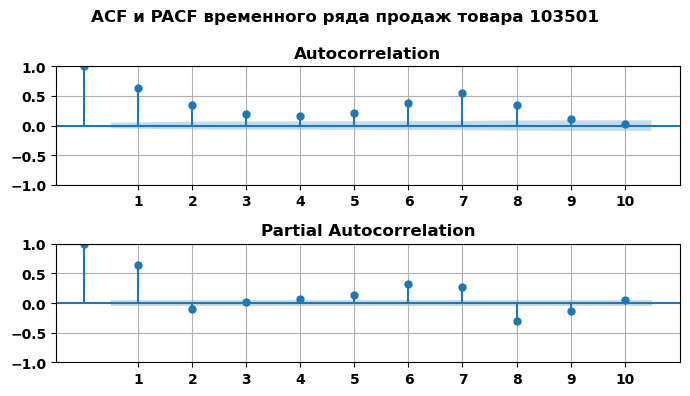

In [114]:
fig = plt.figure(figsize=(7,4))
fig.suptitle('ACF и PACF временного ряда продаж товара 103501')
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(unit_sales, lags=10, ax=ax1)
plt.xticks(np.arange(1, 11)) 
plt.grid()
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(unit_sales, lags=10, ax=ax2)
plt.xticks(np.arange(1, 11)) 
plt.grid()
plt.tight_layout()
plt.show()

**Вывод:**\
Итак, проверим p = 6 или 7, т.к. данные лаги наиболее отличны от нуля.\
Протестируем q = 2, 6 или 7.

Напомню, что для всех продаж мы определили порядок интегрирования $d=1$, $p$ = 2, 5 или 6, $q$ = 7.

Строим модель ARIMA для краткосрочного прогноза продаж продукта 103501.

In [115]:
# разбиваем данные на тренировочную и тестовую части последовательно, чтобы не нарушить ряд
x_train_unit, y_train_unit = unit_lr[:-predict_size_unit].drop(["Original Values"], axis=1), unit_lr[:-predict_size_unit]["Original Values"]
x_test_unit, y_test_unit  = unit_lr[-predict_size_unit:].drop(["Original Values"], axis =1), unit_lr[-predict_size_unit:]["Original Values"]

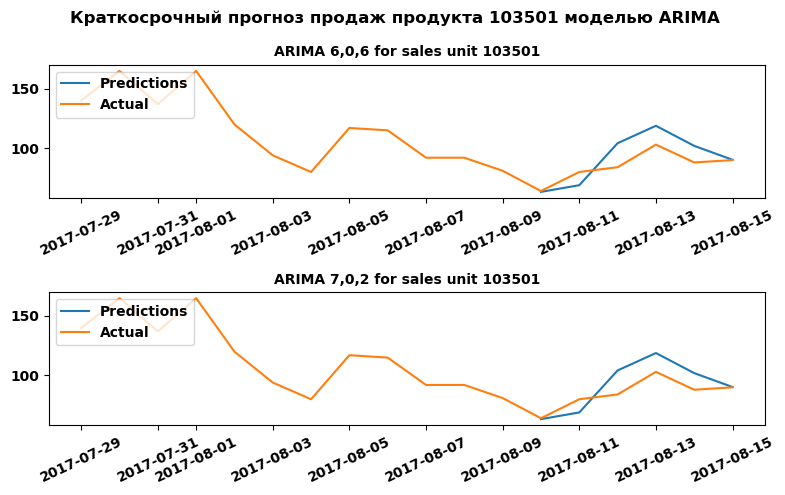

In [116]:
# задаем параметры модели p, d, q = 6, 0, 6
model_1 = ARIMA(y_train_unit.values.reshape(-1), order=(6,0,6))
train_size = len(y_train_unit)
test_size = predict_size_unit
arima_1_predictions = model_1.fit().predict(start=train_size, end=train_size+test_size-1, dynamic=False)

# задаем параметры модели p, d, q = 7, 0, 2
model_2 = ARIMA(y_train_unit.values.reshape(-1), order=(7,0,2))
arima_2_predictions = model_2.fit().predict(start=train_size, end=train_size+test_size-1, dynamic=False)

# визуализируем
fig,ax = plt.subplots(2, 1, figsize=(8,5))
fig.suptitle('Краткосрочный прогноз продаж продукта 103501 моделью ARIMA', fontsize=12)
ax[0].set_title('ARIMA 6,0,6 for sales unit 103501', fontsize=10)
ax[0].plot(pd.Series(arima_1_predictions, index=y_test_unit.index), label = "Predictions")
ax[0].plot(pd.concat([y_train_unit, y_test_unit], axis = 0)[-shown_train_size_unit:], label = "Actual")
ax[0].legend(loc="upper left")
ax[0].tick_params(axis='x', rotation=25)

ax[1].set_title('ARIMA 7,0,2 for sales unit 103501', fontsize=10)
ax[1].plot(pd.Series(arima_1_predictions, index=y_test_unit.index), label = "Predictions")
ax[1].plot(pd.concat([y_train_unit, y_test_unit], axis = 0)[-shown_train_size_unit:], label = "Actual")
ax[1].legend(loc="upper left")
ax[1].tick_params(axis='x', rotation=25)
plt.tight_layout()
plt.show()

In [117]:
MSE_1 = np.round(mean_squared_error(y_test_unit, arima_1_predictions),2)
MAE_1 = np.round(mean_absolute_error(y_test_unit, arima_1_predictions),2)
MAPE_1 = np.round(mean_absolute_percentage_error(y_test_unit, arima_1_predictions)*100,2)

MSE_2 = np.round(mean_squared_error(y_test_unit, arima_2_predictions),2)
MAE_2 = np.round(mean_absolute_error(y_test_unit, arima_2_predictions),2)
MAPE_2 = np.round(mean_absolute_percentage_error(y_test_unit, arima_2_predictions)*100,2)

metrics_ARIMA = pd.DataFrame({'MSE': [MSE_1, MSE_2], 'MAE': [MAE_1, MAE_2], 'MAPE': [MAPE_1, MAPE_2]}, 
                             index=['ARIMA (6,0,6)', 'ARIMA (7,0,2)'])
metrics_ARIMA

,MSE,MAE,MAPE
"ARIMA (6,0,6)",162.93,10.35,11.77
"ARIMA (7,0,2)",140.12,9.10,11.33


**Вывод:**\
Для временного ряда продаж *unit 103501* мы немного сократили ошибку c 12.34 MAPE до 11.33 c помощью модели ARIMA.

Построим модель ARIMA для ряда общих продаж.

In [118]:
# разбиваем данные на тренировочную и тестовую части последовательно, чтобы не нарушить ряд
x_train_all, y_train_all = sales_lr[:-predict_size_all].drop(["Original Values"], axis=1), sales_lr[:-predict_size_all]["Original Values"]
x_test_all, y_test_all  = sales_lr[-predict_size_all:].drop(["Original Values"], axis =1), sales_lr[-predict_size_all:]["Original Values"]

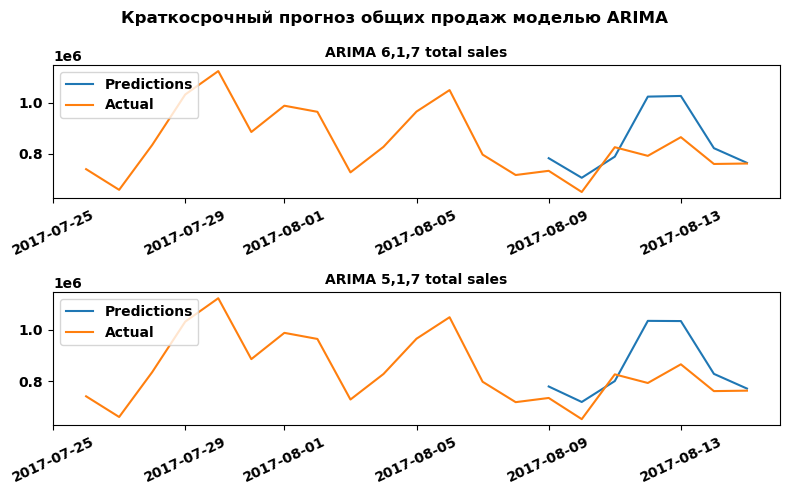

In [119]:
# задаем параметры модели p, d, q = 6, 1, 7
arima_1 = ARIMA(y_train_all.values.reshape(-1), order=(6,1,7))
train_size = len(y_train_all)
test_size = predict_size_all
arima_1_pred = arima_1.fit().predict(start=train_size, end=train_size+test_size-1, dynamic=False)

# задаем параметры модели p, d, q = 5, 1, 7
arima_2 = ARIMA(y_train_all.values.reshape(-1), order=(5,1,7))
arima_2_pred = arima_2.fit().predict(start=train_size, end=train_size+test_size-1, dynamic=False)

# визуализируем
fig,ax = plt.subplots(2, 1, figsize=(8,5))
fig.suptitle('Краткосрочный прогноз общих продаж моделью ARIMA', fontsize=12)
ax[0].set_title('ARIMA 6,1,7 total sales', fontsize=10)
ax[0].plot(pd.Series(arima_1_pred, index=y_test_all.index), label = "Predictions")
ax[0].plot(pd.concat([y_train_all, y_test_all], axis = 0)[-shown_train_size_all:], label = "Actual")
ax[0].legend(loc="upper left")
ax[0].tick_params(axis='x', rotation=25)

ax[1].set_title('ARIMA 5,1,7 total sales', fontsize=10)
ax[1].plot(pd.Series(arima_2_pred, index=y_test_all.index), label = "Predictions")
ax[1].plot(pd.concat([y_train_all, y_test_all], axis = 0)[-shown_train_size_all:], label = "Actual")
ax[1].legend(loc="upper left")
ax[1].tick_params(axis='x', rotation=25)
plt.tight_layout()
plt.show()

In [120]:
MSE_1 = np.round(mean_squared_error(y_test_all, arima_1_pred),2)
MAE_1 = np.round(mean_absolute_error(y_test_all, arima_1_pred),2)
MAPE_1 = np.round(mean_absolute_percentage_error(y_test_all, arima_1_pred)*100,2)

MSE_2 = np.round(mean_squared_error(y_test_all, arima_2_pred),2)
MAE_2 = np.round(mean_absolute_error(y_test_all, arima_2_pred),2)
MAPE_2 = np.round(mean_absolute_percentage_error(y_test_all, arima_2_pred)*100,2)

metrics_ARIMA = pd.DataFrame({'MSE': [MSE_1, MSE_2], 'MAE': [MAE_1, MAE_2], 'MAPE': [MAPE_1, MAPE_2]}, 
                             index=['ARIMA (6,1,7)', 'ARIMA (5,1,7)'])
metrics_ARIMA

,MSE,MAE,MAPE
"ARIMA (6,1,7)",1.287817e+10,85478.75,10.85
"ARIMA (5,1,7)",1.417743e+10,89328.62,11.38


Итак, краткосрочный прогноз ARIMA для общего объема продаж слабее LinearRegression: 10.38 ARIMA MAPE против 7 LR MAPE.

Теперь мы переходим к более сложным алгоритмам.\
Давайте попробуем специальную библиотеку для предсказания временных рядов Prophet, которую в основном используют для долгосрочных прогнозов.

## 5. Prophet для прогноза общих продаж сети магазинов Favorita.
Входными данными для Prophet является dataframe с двумя столбцами: *ds* и *y*. Столбец *ds* (отметка даты) должен содержать дату или дату и время. Столбец *y* должен быть числовым и представлять измерение, которое мы хотим спрогнозировать.

In [121]:
print('Исходные данные:', all_sales.head(), sep='\n')
# отобразим исходный ряд
fig = go.Figure()
fig.add_trace(go.Scatter(x=all_sales.index, y=all_sales.unit_sales))
fig.update_layout(
    title={'text': "Общие ежедневные продажи",'x':0.5,'xanchor': 'center', 'yanchor': 'top'}, 
    width=1000, height=400,
    autosize=False, margin=dict(t=30, b=60, l=30, r=10),
    template="plotly"
    )
py.iplot(fig)

Исходные данные:
            unit_sales
date                  
2013-01-01    2511.619
2013-01-02  496092.418
2013-01-03  361429.231
2013-01-04  354459.677
2013-01-05  477350.121


Задаем нужные наименования столбцам.

In [122]:
data = pd.DataFrame(all_sales).reset_index()
data.columns = ['ds', 'y']
data.head()

,ds,y
0,2013-01-01,2511.619
1,2013-01-02,496092.418
2,2013-01-03,361429.231
3,2013-01-04,354459.677
4,2013-01-05,477350.121


Моделируем и делаем долгосрочное предсказание на год.

In [123]:
os.environ["CMDSTAN"] = "C:/cmdstan/cmdstan-2.36.0"
prophet = Prophet(stan_backend='CMDSTANPY')
prophet.fit(data)
future = prophet.make_future_dataframe(periods=365)
forecast = prophet.predict(future)
forecast.head()

15:48:08 - cmdstanpy - INFO - Chain [1] start processing
15:48:08 - cmdstanpy - INFO - Chain [1] done processing


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2013-01-01,337379.846448,251763.166782,524992.622141,337379.846448,337379.846448,43217.560947,43217.560947,43217.560947,-68159.525517,-68159.525517,-68159.525517,111377.086464,111377.086464,111377.086464,0.0,0.0,0.0,380597.407395
1,2013-01-02,337742.011331,258486.896938,534922.749773,337742.011331,337742.011331,55170.251416,55170.251416,55170.251416,-44209.889826,-44209.889826,-44209.889826,99380.141242,99380.141242,99380.141242,0.0,0.0,0.0,392912.262747
2,2013-01-03,338104.176215,151295.422376,434441.511999,338104.176215,338104.176215,-44496.903543,-44496.903543,-44496.903543,-131862.241759,-131862.241759,-131862.241759,87365.338216,87365.338216,87365.338216,0.0,0.0,0.0,293607.272672
3,2013-01-04,338466.341098,207787.398523,505998.849950,338466.341098,338466.341098,18450.013485,18450.013485,18450.013485,-57061.283806,-57061.283806,-57061.283806,75511.297292,75511.297292,75511.297292,0.0,0.0,0.0,356916.354584
4,2013-01-05,338828.505982,398622.100118,675384.439102,338828.505982,338828.505982,197991.666964,197991.666964,197991.666964,134005.171211,134005.171211,134005.171211,63986.495753,63986.495753,63986.495753,0.0,0.0,0.0,536820.172945


In [124]:
# посмотрим на полученный прогноз
fig = go.Figure()
fig.add_trace(go.Scatter(x=data.ds, y=data.y, name='y'))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend'))
fig.update_layout(
    title={'text': "Истинные и предсказанные значения общих продаж",'x':0.5,'xanchor': 'center', 'yanchor': 'top'}, 
    width=1000, height=500,
    autosize=False, margin=dict(t=30, b=60, l=30, r=10),
    template="plotly", 
    legend=dict(orientation='h')
    )
py.iplot(fig)

In [125]:
print('RMSE: %f' % np.round(np.sqrt(np.mean((forecast.loc[:len(data), 'yhat']-data['y'])**2)),2))
print('MAPE: %f' % np.round(np.mean(np.abs((data['y'] - forecast['yhat'].iloc[:len(data)]) / data['y']))*100, 2))

RMSE: 109323.180000
MAPE: 36.490000


Несмотря на то, что модель уловила восходящую линию тренда, а также сильные колебания в конце года, ошибка очень большая.\
Давайте сделаем тренд более подвижным с помощью гиперпараметра *changepoint_prior_scale* (сила разреженности). По умолчанию этот параметр установлен на 0.05. Его увеличение сделает тренд более гибким.

In [126]:
dict_rmse = {}
for i in np.arange(1, 4, 0.5):
    model = Prophet(changepoint_prior_scale=i)
    model.fit(data)
    future = model.make_future_dataframe(periods=365)
    forecast = model.predict(future) 
    rmse = np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-data['y'])**2))
    mape = np.mean(np.abs((data['y'] - forecast['yhat'].iloc[:len(data)]) / data['y'])) * 100
    dict_rmse[i] = [rmse, mape]

15:48:09 - cmdstanpy - INFO - Chain [1] start processing
15:48:10 - cmdstanpy - INFO - Chain [1] done processing
15:48:11 - cmdstanpy - INFO - Chain [1] start processing
15:48:11 - cmdstanpy - INFO - Chain [1] done processing
15:48:12 - cmdstanpy - INFO - Chain [1] start processing
15:48:12 - cmdstanpy - INFO - Chain [1] done processing
15:48:13 - cmdstanpy - INFO - Chain [1] start processing
15:48:14 - cmdstanpy - INFO - Chain [1] done processing
15:48:14 - cmdstanpy - INFO - Chain [1] start processing
15:48:15 - cmdstanpy - INFO - Chain [1] done processing
15:48:16 - cmdstanpy - INFO - Chain [1] start processing
15:48:16 - cmdstanpy - INFO - Chain [1] done processing


In [127]:
dict_rmse

{1.0: [97835.01854309386, 34.090617001802556],
 1.5: [97683.93743210923, 34.084673292002435],
 2.0: [97586.43356803476, 34.03812496462083],
 2.5: [97559.59951164862, 33.99957967864496],
 3.0: [97436.43856205496, 33.87675844972687],
 3.5: [97405.02356868175, 33.8781945562402]}

In [128]:
prophet = Prophet(changepoint_prior_scale=3.5)
prophet.fit(data)
future = prophet.make_future_dataframe(periods=365)
forecast = prophet.predict(future)

15:48:17 - cmdstanpy - INFO - Chain [1] start processing
15:48:17 - cmdstanpy - INFO - Chain [1] done processing


In [129]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=data.ds, y=data.y, name='y'))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend'))
fig.update_layout(
    title={'text': "Истинные и предсказанные значения общих продаж",'x':0.5,'xanchor': 'center', 'yanchor': 'top'}, 
    width=1000, height=500,
    autosize=False, margin=dict(t=30, b=60, l=30, r=10),
    template="plotly", 
    legend=dict(orientation='h')
    )
py.iplot(fig)
print('RMSE: %f' % np.round(np.sqrt(np.mean((forecast.loc[:len(data), 'yhat']-data['y'])**2)),2))
print('MAPE: %f' % np.round(np.mean(np.abs((data['y'] - forecast['yhat'].iloc[:len(data)]) / data['y']))*100, 2))

RMSE: 97378.000000
MAPE: 33.880000


Ошибка сократилась совсем немного, а по тренду можно говорить о переобучении, потому что исторические данные он хорошо отражает, а предсказывает линейно.

Попробуем улучшить нашу модель, добавив месячную сезонность и понизим немного значение changepoint_prior_scale.


In [130]:
prophet = Prophet(changepoint_prior_scale=2.5)
# добавляем месячную сезонность
prophet.add_seasonality(name='monthly', period=30.5, fourier_order=5)
prophet.fit(data)
future = prophet.make_future_dataframe(periods=365)
forecast = prophet.predict(future)

15:48:19 - cmdstanpy - INFO - Chain [1] start processing
15:48:19 - cmdstanpy - INFO - Chain [1] done processing


In [131]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=data.ds, y=data.y, name='y'))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend'))
fig.update_layout(
    title={'text': "Истинные и предсказанные значения",'x':0.5,'xanchor': 'center', 'yanchor': 'top'}, 
    width=1000, height=500,
    autosize=False, margin=dict(t=30, b=60, l=30, r=10),
    template="plotly", 
    legend=dict(orientation='h')
    )
py.iplot(fig)
print('RMSE: %f' % np.round(np.sqrt(np.mean((forecast.loc[:len(data), 'yhat']-data['y'])**2)),2))
print('MAPE: %f' % np.round(np.mean(np.abs((data['y'] - forecast['yhat'].iloc[:len(data)]) / data['y']))*100, 2))

RMSE: 90881.050000
MAPE: 35.620000


RMSE ошибка сократилась 97378 до 90881, но, по-прежнему, прогноз очень нестабильный и линейный.

У нас есть данные о праздниках и мы можем их использовать в качестве экзогенных признаков для улучшения качества модели Prophet.

In [132]:
df_holidays = pd.read_csv('data/holidays_events.zip')
df_holidays.head()

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [133]:
# отфильтруем праздники, исключив перенесенные и оставив только даты и сами праздники
holidays = df_holidays[df_holidays['transferred'] == False][['date','description']]
holidays.columns = ['ds', 'holiday']
holidays

,ds,holiday
0,2012-03-02,Fundacion de Manta
1,2012-04-01,Provincializacion de Cotopaxi
2,2012-04-12,Fundacion de Cuenca
3,2012-04-14,Cantonizacion de Libertad
4,2012-04-21,Cantonizacion de Riobamba
...,...,...
345,2017-12-22,Navidad-3
346,2017-12-23,Navidad-2
347,2017-12-24,Navidad-1
348,2017-12-25,Navidad


In [134]:
def make_prediction(data, n=365, changepoint_prior_scale=2.5, seasonality_prior_scale=5.0):
    prophet = Prophet(
        changepoint_prior_scale=changepoint_prior_scale,
        seasonality_prior_scale=seasonality_prior_scale,
        holidays=holidays,
        yearly_seasonality=True,
        weekly_seasonality=True,
        daily_seasonality=False
    )
    # добавляем месячную сезонность
    prophet.add_seasonality(name='monthly', period=30.5, fourier_order=10)
    prophet.fit(data)
    future = prophet.make_future_dataframe(periods=n)
    forecast = prophet.predict(future)
    return forecast

In [135]:
forecast = make_prediction(data)

15:48:21 - cmdstanpy - INFO - Chain [1] start processing
15:48:24 - cmdstanpy - INFO - Chain [1] done processing


In [136]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=data.ds, y=data.y, name='y'))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'))
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend'))
fig.update_layout(
    title={'text': "Истинные и предсказанные значения Prophet при учете праздников",'x':0.5,'xanchor': 'center', 'yanchor': 'top'}, 
    width=1000, height=500,
    autosize=False, margin=dict(t=30, b=60, l=30, r=10),
    template="plotly", 
    legend=dict(orientation='h')
    )
py.iplot(fig)
print('RMSE: %f' % np.round(np.sqrt(np.mean((forecast.loc[:len(data), 'yhat']-data['y'])**2)),2))
print('MAPE: %f' % np.round(np.mean(np.abs((data['y'] - forecast['yhat'].iloc[:len(data)]) / data['y']))*100, 2))

RMSE: 74034.940000
MAPE: 19.780000


Добавление праздников отлично помогло, существенно сократилась ошибка с 90881 до 74035 RMSE.

Модель Prophet используют в основном для долгосрочных прогнозов, мы добились неплохого результата для таких сроков, но в завершении вновь обратимся к классике - градиентному бустингу.

Перед этим запустим на Prophet временной ряд магазина 25.

**Prophet прогноз для ряда продаж магазина 25**

In [137]:
print('Исходные данные ряда товара 103501:', store_25.head(), sep='\n')
# отобразим исходный ряд
fig = go.Figure()
fig.add_trace(go.Scatter(x=store_25.index, y=store_25.unit_sales))
fig.update_layout(
    title={'text': "Продажи товара 103501",'x':0.5,'xanchor': 'center', 'yanchor': 'top'}, 
    width=800, height=300,
    autosize=False, margin=dict(t=30, b=60, l=30, r=10),
    template="plotly"
    )
py.iplot(fig)

Исходные данные ряда товара 103501:
            unit_sales
date                  
2013-01-01    2511.619
2013-01-02    5316.224
2013-01-03    4442.913
2013-01-04    4844.354
2013-01-05    5817.526


In [138]:
data_store = pd.DataFrame(store_25).reset_index()
data_store.columns = ['ds', 'y']

forecast_store = make_prediction(data_store, changepoint_prior_scale=3.0, seasonality_prior_scale=5.0)

fig = go.Figure()
fig.add_trace(go.Scatter(x=data_store.ds, y=data_store.y, name='y'))
fig.add_trace(go.Scatter(x=forecast_store['ds'], y=forecast_store['yhat'], name='yhat'))
fig.add_trace(go.Scatter(x=forecast_store['ds'], y=forecast_store['yhat_upper'], fill='tonexty', mode='none', name='upper'))
fig.add_trace(go.Scatter(x=forecast_store['ds'], y=forecast_store['yhat_lower'], fill='tonexty', mode='none', name='lower'))
fig.add_trace(go.Scatter(x=forecast_store['ds'], y=forecast_store['trend'], name='Trend'))
fig.update_layout(
    title={'text': "Истинные и предсказанные значения Prophet при учете праздников",'x':0.5,'xanchor': 'center', 'yanchor': 'top'}, 
    width=1000, height=400,
    autosize=False, margin=dict(t=30, b=60, l=30, r=10),
    template="plotly", 
    legend=dict(orientation='h')
    )
py.iplot(fig)
print('RMSE: %f' % np.round(np.sqrt(np.mean((forecast_store.loc[:len(data_store), 'yhat']-data_store['y'])**2)),2))
print('MAPE: %f' % np.round(np.mean(np.abs((data_store['y'] - forecast_store['yhat'].iloc[:len(data_store)]) / data_store['y']))*100, 2))

15:48:25 - cmdstanpy - INFO - Chain [1] start processing
15:48:28 - cmdstanpy - INFO - Chain [1] done processing


RMSE: 2730.220000
MAPE: 24.330000


## 6. Feature engineering for modeling XGBoost и CatBoost

In [139]:
all_sales.head()

,unit_sales
date,
2013-01-01,2511.619
2013-01-02,496092.418
2013-01-03,361429.231
2013-01-04,354459.677
2013-01-05,477350.121


In [140]:
df = all_sales.reset_index()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1684 entries, 0 to 1683
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   date        1684 non-null   datetime64[ns]
 1   unit_sales  1684 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 26.4 KB


### 6.1 Праздничные дни
Взглянем еще раз на праздники, потому что мы отметили, что они играют важную роль для качества прогноза.\
Загружаем список праздников из специальной библиотеки holidays, указав страну Эквадор.

In [141]:
# !pip install holidays
import holidays
ec_holidays = holidays.country_holidays('EC')

In [142]:
# если дата из нашего ряда есть в праздничных датах, указываем 1, отсутствие - 0
df['is_holiday'] = df['date'].apply(lambda x: 1 if x in ec_holidays else 0)
# добавляем название праздника
df['holiday_name'] = df['date'].map(ec_holidays).fillna('No Holiday')
df.head()

,date,unit_sales,is_holiday,holiday_name
0,2013-01-01,2511.619,1,Año Nuevo
1,2013-01-02,496092.418,0,No Holiday
2,2013-01-03,361429.231,0,No Holiday
3,2013-01-04,354459.677,0,No Holiday
4,2013-01-05,477350.121,0,No Holiday


In [143]:
# посмотрим сколько праздничных дней в ряде согласно библиотеке holidays
df['is_holiday'].value_counts()

is_holiday
0    1634
1      50
Name: count, dtype: int64

Так как у нас имеется дополнительный файл, описывающий только праздники, то давайте его добавим к нашему основному набору и посмотрим, сколько праздников получится в итоге.

In [144]:
df_holidays = pd.read_csv('data/holidays_events.zip')
df_holidays = df_holidays[df_holidays['transferred']==False][['date', 'description']]
df_holidays['date'] = pd.to_datetime(df_holidays['date'])

In [145]:
# добавляем к основному набору
df = df.merge(df_holidays, on='date', how='left')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1714 entries, 0 to 1713
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          1714 non-null   datetime64[ns]
 1   unit_sales    1714 non-null   float64       
 2   is_holiday    1714 non-null   int64         
 3   holiday_name  1714 non-null   object        
 4   description   273 non-null    object        
dtypes: datetime64[ns](1), float64(1), int64(1), object(2)
memory usage: 67.1+ KB


Так как возросло количество значений, значит, на некоторые даты приходится два праздника одновременно и у нас появились дубликаты.\
Необходимо от них избавиться.

In [146]:
duplicates_count = df['date'].duplicated().sum()
print(f'Количество дубликатов: {duplicates_count}')
duplicates = df[df.duplicated(subset=['date'])].index
df.iloc[duplicates]

Количество дубликатов: 30


,date,unit_sales,is_holiday,holiday_name,description
132,2013-05-12,3.878605e+05,0,No Holiday,Dia de la Madre
177,2013-06-25,3.051195e+05,0,No Holiday,Fundacion de Machala
178,2013-06-25,3.051195e+05,0,No Holiday,Cantonizacion de Latacunga
187,2013-07-03,3.745519e+05,0,No Holiday,Fundacion de Santo Domingo
360,2013-12-22,6.962951e+05,0,No Holiday,Cantonizacion de Salinas
545,2014-06-25,3.553424e+05,0,No Holiday,Fundacion de Machala
546,2014-06-25,3.553424e+05,0,No Holiday,Provincializacion de Imbabura
547,2014-06-25,3.553424e+05,0,No Holiday,Mundial de futbol Brasil: Ecuador-Francia
556,2014-07-03,5.838437e+05,0,No Holiday,Fundacion de Santo Domingo
729,2014-12-22,1.008143e+06,0,No Holiday,Navidad-3


Прежде всего мы видим, что библиотека holidays возможно учитывает праздничные дни без продления или не учитывает какие-либо региональные/местно-локальные праздники, которые не имеют общенационального уровня, но они отмечаются и влияют на продажи продуктов.

Удаляем дубликаты, несоотвествующий нашим требованиям столбец *holiday_name* и исправляем столбец *is_holiday*.

In [147]:
df = df.drop(duplicates, axis=0).drop('holiday_name', axis=1)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1684 entries, 0 to 1713
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date         1684 non-null   datetime64[ns]
 1   unit_sales   1684 non-null   float64       
 2   is_holiday   1684 non-null   int64         
 3   description  243 non-null    object        
dtypes: datetime64[ns](1), float64(1), int64(1), object(1)
memory usage: 65.8+ KB


In [148]:
df['is_holiday'] = df['description'].notna().astype(int)
df['is_holiday'].value_counts()

is_holiday
0    1441
1     243
Name: count, dtype: int64

Итак, один признак мы создали: праздничный день. Удаляем теперь ненужный признак *description*.

In [149]:
df.drop('description', axis=1, inplace=True)

### 6.2 Транзакции
Так как у нас имеется еще один дополнительный файл с транзакциями, давайте попробуем извлечь из него полезные данные.

In [150]:
transactions = pd.read_csv('data/transactions.zip')
transactions.head()


,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922


In [151]:
# группируем по дате
transactions = transactions.groupby('date', as_index=False)['transactions'].sum()
transactions['date'] = pd.to_datetime(transactions['date'])
transactions.head()

,date,transactions
0,2013-01-01,770
1,2013-01-02,93215
2,2013-01-03,78504
3,2013-01-04,78494
4,2013-01-05,93573


In [152]:
# объединяем с основным набором
df = df.merge(transactions, on='date', how='left')
df.head()

,date,unit_sales,is_holiday,transactions
0,2013-01-01,2511.619,1,770.0
1,2013-01-02,496092.418,0,93215.0
2,2013-01-03,361429.231,0,78504.0
3,2013-01-04,354459.677,0,78494.0
4,2013-01-05,477350.121,1,93573.0


In [153]:
# проверка на пропуски
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1684 entries, 0 to 1683
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          1684 non-null   datetime64[ns]
 1   unit_sales    1684 non-null   float64       
 2   is_holiday    1684 non-null   int32         
 3   transactions  1682 non-null   float64       
dtypes: datetime64[ns](1), float64(2), int32(1)
memory usage: 46.2 KB


In [154]:
index_null = df[df['transactions'].isnull()].index
df.loc[index_null]

,date,unit_sales,is_holiday,transactions
1092,2016-01-01,16433.394,1,NaN
1094,2016-01-03,1226735.718,0,NaN


In [155]:
# заполняем линейным методом пропуски в транзакциях, их немного и можно таким образом рискнуть
df['transactions'] = df['transactions'].interpolate(method='linear')
df.iloc[1090:1096]

,date,unit_sales,is_holiday,transactions
1090,2015-12-30,1030043.736,0,118947.0
1091,2015-12-31,964641.541,1,131826.0
1092,2016-01-01,16433.394,1,100727.0
1093,2016-01-02,1066677.424,0,69628.0
1094,2016-01-03,1226735.718,0,43728.5
1095,2016-01-04,955956.875,0,17829.0


### 6.3 Временные признаки
Наступило время классического извлечения признаков из даты.

In [156]:
def create_features(df, label=None):
    """
    Создаем признаки из даты
    """
    df['year'] = df['date'].dt.year
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month 
    df['dayofweek'] = df['date'].dt.dayofweek
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.isocalendar().week
    df['dayofyear'] = df['date'].dt.dayofyear

    return df

In [157]:
new_df = create_features(df)
new_df.head()

,date,unit_sales,is_holiday,transactions,year,quarter,month,dayofweek,dayofmonth,weekofyear,dayofyear
0,2013-01-01,2511.619,1,770.0,2013,1,1,1,1,1,1
1,2013-01-02,496092.418,0,93215.0,2013,1,1,2,2,1,2
2,2013-01-03,361429.231,0,78504.0,2013,1,1,3,3,1,3
3,2013-01-04,354459.677,0,78494.0,2013,1,1,4,4,1,4
4,2013-01-05,477350.121,1,93573.0,2013,1,1,5,5,1,5


Наши данные готовы, мы можем приступить к моделированию.\
Делим ряд на тренировочную и тестовую часть, для теста оставим один год.

In [158]:
new_df = new_df.set_index('date')
split_date = pd.to_datetime('2016-08-15')

X_train, y_train = new_df.drop('unit_sales', axis=1).loc[new_df.index < split_date], new_df['unit_sales'].loc[new_df.index < split_date]
X_test, y_test = new_df.drop('unit_sales', axis=1).loc[new_df.index >= split_date], new_df['unit_sales'].loc[new_df.index >= split_date]

X_train.shape, y_train.shape

((1319, 9), (1319,))

## 7. Модели XGBoost и CatBoost.
### 7.1 XGBoost

In [159]:
xgb_model = xgb.XGBRegressor(n_estimators=1000, early_stopping_rounds=20, max_depth=2, learning_rate=0.1, random_seed=42)
xgb_model.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        verbose=False)
repr(xgb_model)

'XGBRegressor(base_score=None, booster=None, callbacks=None,\n             colsample_bylevel=None, colsample_bynode=None,\n             colsample_bytree=None, device=None, early_stopping_rounds=20,\n             enable_categorical=False, eval_metric=None, feature_types=None,\n             gamma=None, grow_policy=None, importance_type=None,\n             interaction_constraints=None, learning_rate=0.1, max_bin=None,\n             max_cat_threshold=None, max_cat_to_onehot=None,\n             max_delta_step=None, max_depth=2, max_leaves=None,\n             min_child_weight=None, missing=nan, monotone_constraints=None,\n             multi_strategy=None, n_estimators=1000, n_jobs=None,\n             num_parallel_tree=None, random_seed=42, ...)'

RMSE 83542
MAPE 20.1


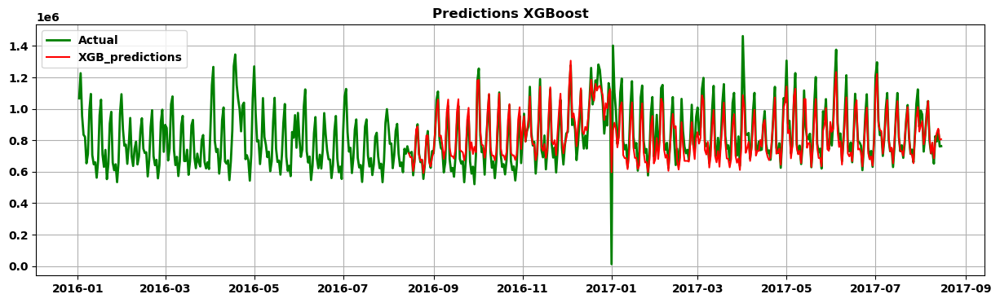

In [160]:
# предсказываем значения для тестового набора
xg_predictions = xgb_model.predict(X_test)
# посмотрим на среднюю абсолютную ошибку в процентах
print('RMSE', round(np.sqrt(mean_squared_error(y_test, xg_predictions))))
print('MAPE', round(mean_absolute_percentage_error(y_test, xg_predictions)*100,2))

xg_predictions = pd.DataFrame(xg_predictions, index=X_test.index)
true_df = pd.concat([y_train.loc[y_train.index > pd.to_datetime('2016-01-01')], y_test], sort=False)
plt.subplots(figsize=(15, 4))
plt.plot(true_df, color='g', linewidth=2)
plt.plot(xg_predictions, color='r', linewidth=1.5)
plt.legend(['Actual', 'XGB_predictions'])
plt.title('Predictions XGBoost')
plt.grid()
plt.show()

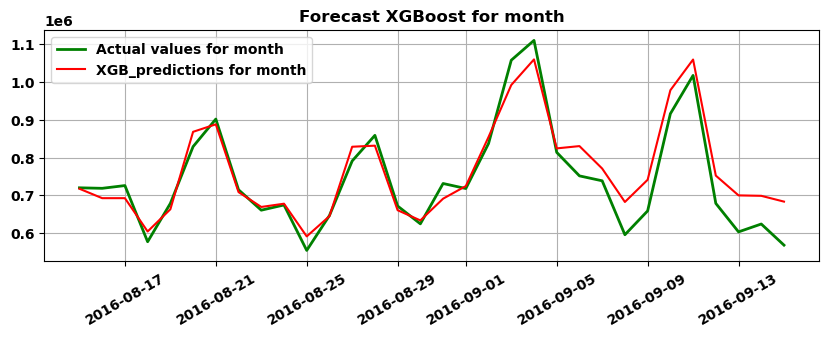

In [161]:
month_y_test = y_test.loc[y_test.index < pd.to_datetime('2016-09-16')]
month_predictions = xg_predictions.loc[xg_predictions.index < pd.to_datetime('2016-09-16')]
plt.subplots(figsize=(10,3))
plt.plot(month_y_test, color='g', linewidth=2)
plt.plot(month_predictions, color='r', linewidth=1.5)
plt.legend(['Actual values for month', 'XGB_predictions for month'])
plt.title('Forecast XGBoost for month')
plt.xticks(rotation=30)
plt.grid()
plt.show()

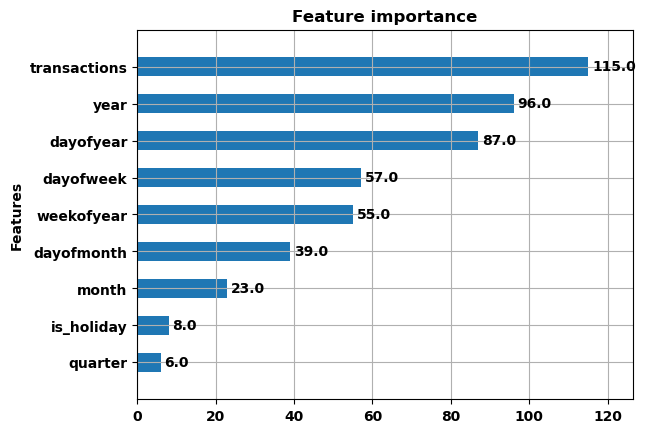

In [162]:
xgb.plot_importance(xgb_model, xlabel='', height=0.5);

### 7.2 CatBoost

In [163]:
catboost= CatBoostRegressor(n_estimators=1000, depth=3, learning_rate=0.1, eval_metric='RMSE', random_seed=42)
catboost.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        use_best_model=True,
        early_stopping_rounds=30,
        verbose=False)

RMSE 70178
MAPE 19.86


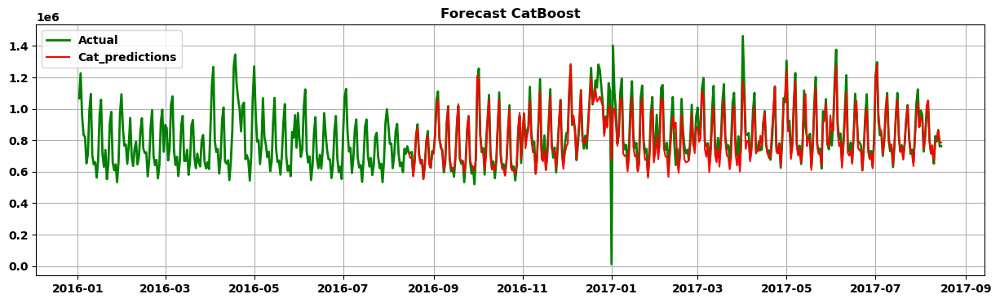

In [164]:
# предсказываем значения для тестового набора
cat_predictions = catboost.predict(X_test)
# посмотрим на среднюю абсолютную ошибку в процентах
print('RMSE', round(np.sqrt(mean_squared_error(y_test, cat_predictions))))
print('MAPE', round(mean_absolute_percentage_error(y_test, cat_predictions)*100,2))

cat_predictions = pd.DataFrame(cat_predictions, index=X_test.index)
true_df = pd.concat([y_train.loc[y_train.index > pd.to_datetime('2016-01-01')], y_test], sort=False)
plt.subplots(figsize=(15, 4))
plt.plot(true_df, color='g', linewidth=2)
plt.plot(cat_predictions, color='r', linewidth=1.5)
plt.legend(['Actual', 'Cat_predictions'])
plt.title('Forecast CatBoost')
plt.grid()
plt.show()

In [165]:
catboost.get_feature_importance(prettified=True)

,Feature Id,Importances
0,year,41.506226
1,transactions,33.413620
2,dayofyear,7.215215
3,dayofweek,5.727392
4,weekofyear,4.282200
5,month,3.292323
6,quarter,2.574645
7,dayofmonth,1.451328
8,is_holiday,0.537051


CatBoost показал результат на уровне Prophet, сделаем прогноз для магазина 25 и отдельного продукта 103501.

**Прогноз CatBoost для продаж магазина 25**

In [166]:
data_store = store_25.reset_index()
data_store = data_store.merge(df_holidays, on='date', how='left')
duplicates_ind = data_store[data_store.duplicated(subset=['date'])].index
data_store = data_store.drop(duplicates_ind, axis=0)
data_store['is_holiday'] = data_store['description'].notna().astype(int)
data_store = data_store.drop('description', axis=1)
data_store = data_store.merge(transactions, on='date', how='left')
data_store['transactions'] = data_store['transactions'].interpolate(method='linear')
data_store = create_features(data_store)
data_store = data_store.set_index('date')
data_store.head()

,unit_sales,is_holiday,transactions,year,quarter,month,dayofweek,dayofmonth,weekofyear,dayofyear
date,,,,,,,,,,
2013-01-01,2511.619,1,770.0,2013,1,1,1,1,1,1
2013-01-02,5316.224,0,93215.0,2013,1,1,2,2,1,2
2013-01-03,4442.913,0,78504.0,2013,1,1,3,3,1,3
2013-01-04,4844.354,0,78494.0,2013,1,1,4,4,1,4
2013-01-05,5817.526,1,93573.0,2013,1,1,5,5,1,5


In [167]:
split_date = pd.to_datetime('2016-08-15')
X_train, y_train = data_store.drop('unit_sales', axis=1).loc[data_store.index < split_date], data_store['unit_sales'].loc[data_store.index < split_date]
X_test, y_test = data_store.drop('unit_sales', axis=1).loc[data_store.index >= split_date], data_store['unit_sales'].loc[data_store.index >= split_date]

X_train.shape, y_train.shape

((1319, 9), (1319,))

RMSE 3674
MAPE 18.52


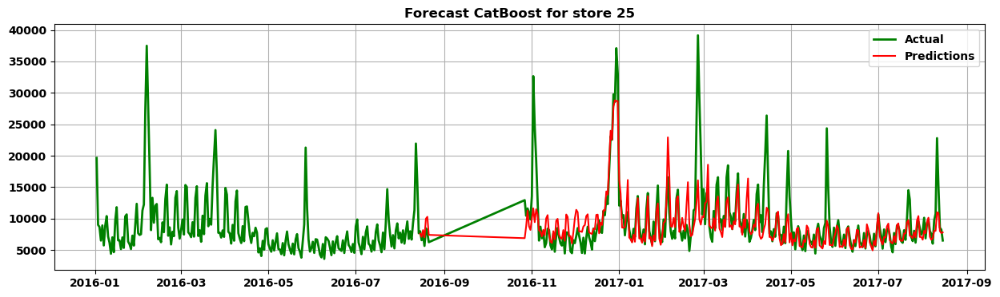

In [168]:
catboost_store= CatBoostRegressor(n_estimators=1000, depth=3, learning_rate=0.1, eval_metric='RMSE', random_seed=42)
catboost_store.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        use_best_model=True,
        early_stopping_rounds=30,
        verbose=False)
# предсказываем значения для тестового набора
store_predictions = catboost_store.predict(X_test)
# посмотрим на среднюю абсолютную ошибку в процентах
print('RMSE', round(np.sqrt(mean_squared_error(y_test, store_predictions))))
print('MAPE', round(mean_absolute_percentage_error(y_test, store_predictions)*100,2))

store_predictions = pd.DataFrame(store_predictions, index=X_test.index)
true_df = pd.concat([y_train.loc[y_train.index > pd.to_datetime('2016-01-01')], y_test], sort=False)
plt.subplots(figsize=(15, 4))
plt.plot(true_df, color='g', linewidth=2)
plt.plot(store_predictions, color='r', linewidth=1.5)
plt.legend(['Actual', 'Predictions'])
plt.title('Forecast CatBoost for store 25')
plt.grid()
plt.show()

### <center>Заключение
1. Долгосрочное прогнозирование с помощью Prophet близко по качеству к бустингам XGBoost и CatBoost, но иммет ряд преимуществ:
* во-первых, нет необходимости генерации признаков, а лишь дополнить некоторыми экзогенными данными
* во-вторых, ошибка у бустинга XGBoost уступает немного prophet, CatBoost дает очень близкое качество.
2. Мы анализировали и делали прогнозы не только для общего ряда, но и для отдельного магазина и товара и убедились, что подход в предсказании должен быть индивидуальным.\
ARIMA лучше LinearRegression справилась для недельного прогноза отдельного товара, чем для общего объема продаж всех товаров. Зато классическая линейная регрессия на минимальных данных (лаги) дала хороший краткосрочный прогноз общему временному ряду.
3. Тот же детальный подход должен быть и для долгосрочного.
4. Предоставленные данные очень разнообразны: различные товары и магазины, конечно, наиболее эффективным будет изучить отдельно временные ряды по каждой позиции и определить оптимальный алгоритм для каждого, так как любой временной ряд имеет свои особенности (закономерности, последовательности).
5. Мы выполнили нашу задачу и показали несколько подходов в прогнозировании, которые можно улучшать за счет настройки параметров и перебора разных алгоритмов.